# Setup

In [ ]:
!wget https://github.com/lucasalexsorensen/sgvop/archive/refs/heads/master.zip
!unzip -q master.zip
!mv sgvop-master/notebooks/images .
!rm -rf sgvop-master
!nvidia-smi
%pip install --quiet ftfy regex tqdm kornia git+https://github.com/openai/CLIP.git
%pip install -U scipy
%mkdir -p figs

Wed Jun 15 13:14:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    27W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

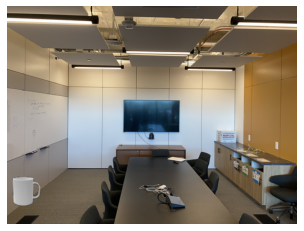

In [ ]:
import torch
import clip
from PIL import Image
from glob import glob
import numpy as np
from matplotlib import lines, pyplot as plt
import os
from tqdm.notebook import tqdm
from collections import defaultdict
from torch import nn
from torch import optim
from torch.nn import functional as F
from torchvision.transforms import Compose, Normalize, Resize, InterpolationMode, ToTensor, CenterCrop, ToPILImage
from kornia.geometry.transform import scale, rotate, translate
from collections import defaultdict
from torch.nn.utils import clip_grad_norm_, clip_grad_value_
from torch.optim.lr_scheduler import MultiStepLR
from kornia.filters import gaussian_blur2d

class BaseRenderer(nn.Module):
    def __init__(self):
        super().__init__()
    def debug(self):
        im = self.forward()
        plt.imshow(im.permute((1,2,0)).cpu().detach())
        plt.axis('off')
        plt.show()
        
device = torch.device("cuda")
np.set_printoptions(precision=4, suppress=True)

im_room = ToTensor()(Image.open('images/room.png')).to(device)
def load_im_mug(mug_size):
    im_mug_tmp = ToTensor()(Image.open('images/mug.png').resize((mug_size,mug_size)))
    im_mug_tmp = im_mug_tmp[:3,:,:] * im_mug_tmp[-1].unsqueeze(0)
    im_mug = torch.zeros_like(im_room).to(device)
    im_mug[
        :,
        (im_mug.shape[1]-mug_size)//2:(im_mug.shape[1]+mug_size)//2,
        (im_mug.shape[2]-mug_size)//2:(im_mug.shape[2]+mug_size)//2,
    ] = im_mug_tmp
    return im_mug

mug_size_rotation = 150
im_mug_rotation = load_im_mug(mug_size_rotation)
class MugMoidRotate(BaseRenderer):
    def __init__(self, s=0, bg=False):
        super().__init__()
        self.s = nn.Parameter(torch.Tensor([s]))
        self.description = 'rotation'
        self.bg = bg

    def forward(self, blur=None):
        room = im_room.clone()
        if blur is not None:
          room = gaussian_blur2d(room.unsqueeze(0), (9,9), sigma=(blur,blur)).squeeze()
        mug = im_mug_rotation.unsqueeze(0)
        mug = rotate(mug, -self.s.tanh()*180)
        mug = mug.squeeze()
        if not self.bg:
            return mug
        room[mug > 0] = mug[mug > 0]
        return room
    
mug_size_scale = 350
im_mug_scale = load_im_mug(mug_size_scale)
class MugMoidScale(BaseRenderer):
    def __init__(self, s=0, bg=False):
        super().__init__()
        self.s = nn.Parameter(torch.Tensor([s]))
        self.description = 'scale'
        self.bg = bg

    def forward(self):
        room = im_room.clone()
        mug = scale(
            im_mug_scale.unsqueeze(0),
            2*self.s.sigmoid().unsqueeze(0)
        ).squeeze()
        if not self.bg:
            return mug
        room[mug > 0] = mug[mug > 0]
        return room
    
mug_size_tx = 50
im_mug_tx = load_im_mug(mug_size_tx)
class MugMoidTranslate(BaseRenderer):
    def __init__(self, s=0, bg=False):
        super().__init__()
        self.s = nn.Parameter(torch.Tensor([s]))
        self.description = 'x-translation'
        self.bg = bg

    def forward(self, blur=None):
        room = im_room.clone()
        if blur is not None:
          room = gaussian_blur2d(room.unsqueeze(0), (7,7), sigma=(blur,blur)).squeeze()
        #room = scale(
        #    room.unsqueeze(0),
        #    torch.tensor([1.0]).to(device).unsqueeze(0),
        #    center=torch.tensor([0.5*im_mug_tx.shape[2], 0.75*im_mug_tx.shape[1]]).to(device).unsqueeze(0)
        #).squeeze(0)

        mug = im_mug_tx.unsqueeze(0)
        translation = torch.cat((
            (im_mug_tx.shape[2]-mug_size_tx)*0.5*self.s.tanh(),
             torch.tensor([im_mug_tx.shape[1]*0.35]).to(device)
        )).unsqueeze(0)
        mug = translate(mug, translation)
        mug = mug.squeeze()
        if not self.bg:
            return mug
        room[mug > 0.2] = mug[mug > 0.2]
        return room
    
plt.imshow(MugMoidTranslate(-2, bg=True).to(device)().cpu().permute((1,2,0)).detach())
plt.axis('off')
plt.show()

In [ ]:
import clip
#model_name = "ViT-B/16"
model_name = "ViT-L/14"
model, preprocess = clip.load(model_name, device=torch.device("cpu"))
model = model.to(device)
p = Compose([t for t in preprocess.transforms if not ('ToTensor' in str(t) or '_convert_image' in str(t))])

100%|████████████████████████████████████████| 890M/890M [00:03<00:00, 246MiB/s]


In [ ]:
def loss_fn(im, text_enc_norm):
    im_enc = model.encode_image(p(im))
    im_enc_norm = im_enc / im_enc.norm(dim=-1).unsqueeze(-1)
    return -(im_enc_norm@text_enc_norm.T).squeeze()

# Mug adjectives sizes

In [ ]:
adjs = ["tiny ", "medium ", "huge "]
text_prompts = [
    f"a {adj}coffee mug with no background"
    for adj in adjs
]
text_enc = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
rc = MugMoidScale

S = np.linspace(-3,1,100)
all_images = torch.stack([rc(s).to(device)() for s in S])

with torch.no_grad():
    #all_losses = loss_fn(all_images, text_enc_norm)
    #all_losses = torch.cdist(im_enctext_enc
    #all_losses = loss_fn(all_images, text_enc_norm)
    im_enc = model.encode_image(p(all_images))
    all_losses = torch.cdist(text_enc, im_enc)
del all_images
torch.cuda.empty_cache()
all_losses = all_losses.cpu()

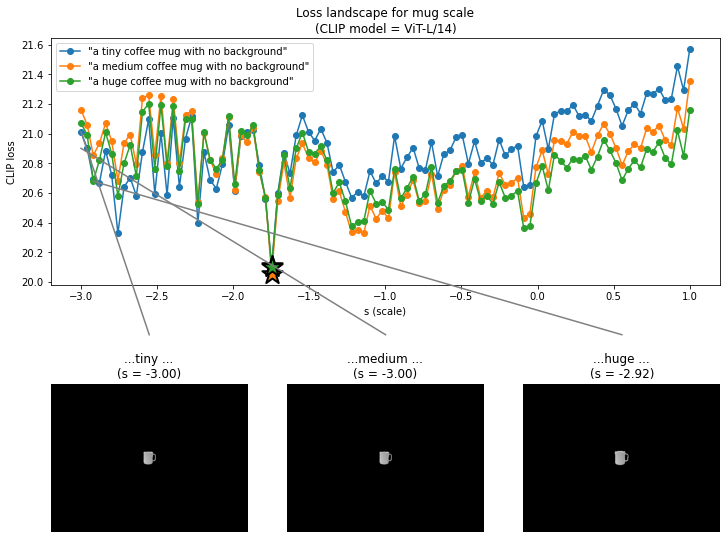

In [ ]:
fig = plt.figure(figsize=(12,10))
plt.subplot(2,1,1)
for prompt,losses in zip(text_prompts, all_losses):
    plt.plot(S, losses, 'o-', label='"%s"' % prompt, zorder=1)
    i_opt = losses.argmin()
    plt.scatter(S[i_opt], losses[i_opt], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5)
plt.xlabel('s (%s)' % rc().description)
plt.ylabel('CLIP loss')
plt.title('Loss landscape for mug %s\n(CLIP model = %s)' % (rc().description, model_name))
plt.legend()
ax_loss = plt.gca()

for i,(adj,losses) in enumerate(zip(adjs, all_losses.T)):
    plt.subplot(2,len(text_prompts),len(text_prompts)+i+1)
    i_opt = losses.argmin()
    im_opt = rc(S[i_opt]).to(device)().cpu().permute((1,2,0)).detach()
    plt.axis('off')
    plt.title('...%s...\n(s = %.2f)' % (adj, S[i_opt]))
    plt.imshow(im_opt, zorder=5)
    ax_im = plt.gca()
    
    transFigure = fig.transFigure.inverted()
    coord1 = transFigure.transform(ax_loss.transData.transform([S[i_opt], losses[i_opt]]))
    coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[1]/2, 0]))
    line = lines.Line2D(
        (coord1[0], coord2[0]),  # xdata
        (coord1[1], coord2[1]),  # ydata
        transform=fig.transFigure,
        color="grey",
        zorder=1
    )
    fig.lines.append(line)

plt.savefig('figs/3_2-scale-optimal-images.pdf', bbox_inches='tight')
plt.show()

# Mug placement in office

In [ ]:
imagenet_templates = [
    'a bad photo of a {}.',
    'a photo of many {}.',
    'a sculpture of a {}.',
    'a photo of the hard to see {}.',
    'a low resolution photo of the {}.',
    'a rendering of a {}.',
    'graffiti of a {}.',
    'a bad photo of the {}.',
    'a cropped photo of the {}.',
    'a tattoo of a {}.',
    'the embroidered {}.',
    'a photo of a hard to see {}.',
    'a bright photo of a {}.',
    'a photo of a clean {}.',
    'a photo of a dirty {}.',
    'a dark photo of the {}.',
    'a drawing of a {}.',
    'a photo of my {}.',
    'the plastic {}.',
    'a photo of the cool {}.',
    'a close-up photo of a {}.',
    'a black and white photo of the {}.',
    'a painting of the {}.',
    'a painting of a {}.',
    'a pixelated photo of the {}.',
    'a sculpture of the {}.',
    'a bright photo of the {}.',
    'a cropped photo of a {}.',
    'a plastic {}.',
    'a photo of the dirty {}.',
    'a jpeg corrupted photo of a {}.',
    'a blurry photo of the {}.',
    'a photo of the {}.',
    'a good photo of the {}.',
    'a rendering of the {}.',
    'a {} in a video game.',
    'a photo of one {}.',
    'a doodle of a {}.',
    'a close-up photo of the {}.',
    'a photo of a {}.',
    'the origami {}.',
    'the {} in a video game.',
    'a sketch of a {}.',
    'a doodle of the {}.',
    'a origami {}.',
    'a low resolution photo of a {}.',
    'the toy {}.',
    'a rendition of the {}.',
    'a photo of the clean {}.',
    'a photo of a large {}.',
    'a rendition of a {}.',
    'a photo of a nice {}.',
    'a photo of a weird {}.',
    'a blurry photo of a {}.',
    'a cartoon {}.',
    'art of a {}.',
    'a sketch of the {}.',
    'a embroidered {}.',
    'a pixelated photo of a {}.',
    'itap of the {}.',
    'a jpeg corrupted photo of the {}.',
    'a good photo of a {}.',
    'a plushie {}.',
    'a photo of the nice {}.',
    'a photo of the small {}.',
    'a photo of the weird {}.',
    'the cartoon {}.',
    'art of the {}.',
    'a drawing of the {}.',
    'a photo of the large {}.',
    'a black and white photo of a {}.',
    'the plushie {}.',
    'a dark photo of a {}.',
    'itap of a {}.',
    'graffiti of the {}.',
    'a toy {}.',
    'itap of my {}.',
    'a photo of a cool {}.',
    'a photo of a small {}.',
    'a tattoo of the {}.',
]
subject = "coffee mug on a table"

with torch.no_grad():
  text_enc = model.encode_text(clip.tokenize([t.replace('{}', subject) for t in imagenet_templates]).to(device))
  text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
  im_enc = model.encode_image(p(rc(s=0.10, bg=bg).to(device)().unsqueeze(0)))
  im_enc_norm = im_enc / im_enc.norm(dim=-1).unsqueeze(-1)

In [ ]:
scores = torch.squeeze(text_enc_norm @ im_enc_norm.T)
sorted_indices = np.argsort(scores.cpu())

print('Best prompts:')
#for prompt,score in zip(imagenet_templates[sorted_indices[-5:]], scores[sorted_indices[-5:]]):
for idx in reversed(sorted_indices)[:5]:
  prompt,score = imagenet_templates[idx], scores[idx]
  print('%.3f\t%s' % (score, prompt))

print('Worst prompts:')
for idx in sorted_indices[:5]:
  prompt,score = imagenet_templates[idx], scores[idx]
  print('%.3f\t%s' % (score, prompt))

Best prompts:
0.236	a rendering of the {}.
0.232	a rendering of a {}.
0.231	a photo of the hard to see {}.
0.226	a photo of a hard to see {}.
0.218	a photo of the clean {}.
Worst prompts:
0.158	a close-up photo of a {}.
0.166	a close-up photo of the {}.
0.167	a embroidered {}.
0.169	graffiti of a {}.
0.169	itap of my {}.


In [ ]:

text_prompts = [
    #"a coffee mug on the floor of an office",
    #"a coffee mug on a table in an office",
    f"a photo of a {subject}.",
    f"a bad photo of the {subject}.",
    f"a origami {subject}.",
    f"a photo of the large {subject}.",
    f"a {subject} in a video game.",
    f"art of the {subject}.",
    f"a photo of the small {subject}.",
]
rc = MugMoidTranslate
bg=True

S = np.linspace(-2,2,100)
with torch.no_grad():
    text_enc = model.encode_text(clip.tokenize(text_prompts).to(device))
    text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
    all_images = torch.stack([rc(s, bg=bg).to(device)() for s in S])
    all_losses = loss_fn(all_images, text_enc_norm)
del all_images
torch.cuda.empty_cache()
all_losses = all_losses.cpu()

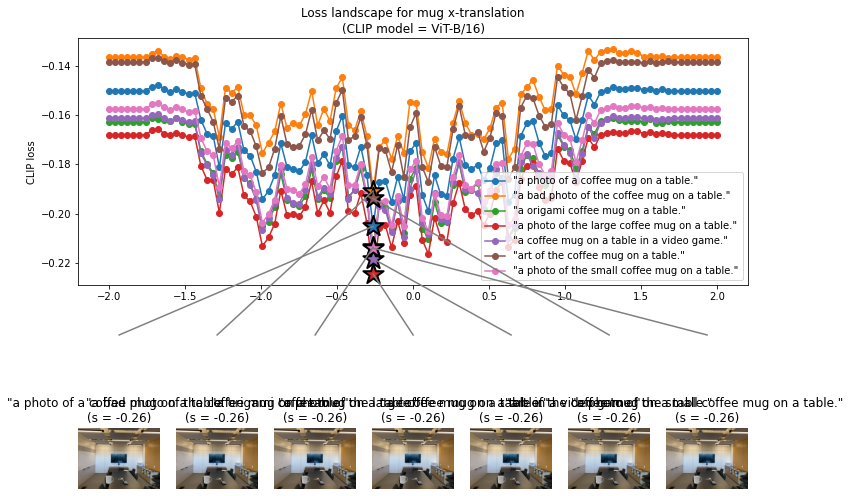

In [ ]:
fig = plt.figure(figsize=(12,10))
plt.subplot(2,1,1)
for prompt,losses in zip(text_prompts, all_losses.T):
    plt.plot(S, losses, 'o-', label='"%s"' % prompt, zorder=1)
    i_opt = losses.argmin()
    plt.scatter(S[i_opt], losses[i_opt], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5)
plt.ylabel('CLIP loss')
plt.title('Loss landscape for mug %s\n(CLIP model = %s)' % (rc().description, model_name))
plt.legend()
ax_loss = plt.gca()

for i,(prompt,losses) in enumerate(zip(text_prompts, all_losses.T)):
    plt.subplot(2,len(text_prompts),len(text_prompts)+i+1)
    i_opt = losses.argmin()
    im_opt = rc(S[i_opt], bg=bg).to(device)().cpu().permute((1,2,0)).detach()
    plt.axis('off')
    plt.title('"%s"\n(s = %.2f)' % (prompt, S[i_opt]))
    plt.imshow(im_opt, zorder=5)
    ax_im = plt.gca()
    
    transFigure = fig.transFigure.inverted()
    coord1 = transFigure.transform(ax_loss.transData.transform([S[i_opt], losses[i_opt]]))
    coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[1]/2, 0]))
    line = lines.Line2D(
        (coord1[0], coord2[0]),  # xdata
        (coord1[1], coord2[1]),  # ydata
        transform=fig.transFigure,
        color="grey",
        zorder=1
    )
    fig.lines.append(line)

plt.savefig('figs/3_2-room-translation-optimal-images.pdf', bbox_inches='tight')
plt.show()

In [ ]:
from itertools import cycle

plt.figure(figsize=(12,6))
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = cycle(prop_cycle.by_key()['color'])

# prompt 1
color=next(colors)
plt.subplot(2,1,1)
i_opt = np.argmin(all_losses[:,0])
zoom = 0.0005
S_zoom = np.concatenate((
    np.linspace(S[i_opt]-zoom, S[i_opt]+zoom,100),
    [S[i_opt]]
))
S_zoom.sort()
with torch.no_grad():
    text_enc = model.encode_text(clip.tokenize(text_prompts[0]).to(device))
    text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
    zoom_images = torch.stack([rc(s, bg=bg).to(device)() for s in S_zoom])
    zoom_losses = loss_fn(zoom_images, text_enc_norm)
del zoom_images
torch.cuda.empty_cache()
zoom_losses = zoom_losses.cpu()

plt.plot(S_zoom, zoom_losses, 'o-', zorder=1, color=color, label=text_prompts[0])
plt.scatter(S[i_opt], all_losses[i_opt,0], marker='*', edgecolor='black', color=color, linewidth=2, s=450, zorder=5)
plt.xlabel('s (%s)' % rc().description)
plt.ylabel('CLIP loss')
plt.title('prompt="%s"' % text_prompts[0])

# prompt 2
color=next(colors)
plt.subplot(2,1,2)
i_opt = np.argmin(all_losses[:,1])
S_zoom = np.concatenate((
    np.linspace(S[i_opt]-zoom, S[i_opt]+zoom,100),
    [S[i_opt]]
))
S_zoom.sort()
with torch.no_grad():
    text_enc = model.encode_text(clip.tokenize(text_prompts[1]).to(device))
    text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
    zoom_images = torch.stack([rc(s, bg=bg).to(device)() for s in S_zoom])
    zoom_losses = loss_fn(zoom_images, text_enc_norm)
del zoom_images
torch.cuda.empty_cache()
zoom_losses = zoom_losses.cpu()
plt.plot(S_zoom, zoom_losses, 'o-', zorder=1, color=color, label=text_prompts[1])
plt.scatter(S[i_opt], all_losses[i_opt,1], marker='*', edgecolor='black', color=color, linewidth=2, s=450, zorder=5)
plt.xlabel('s (%s)' % rc().description)
plt.ylabel('CLIP loss')
plt.title('Zoomed in loss landscape for mug x-translation')
plt.title('prompt="%s"' % text_prompts[0])



plt.suptitle('Office mug x-translation', y=1.03)
plt.tight_layout()
plt.savefig('figs/3_2-room-translation-optimal-images-zoomed.pdf', bbox_inches='tight')
plt.show()

# Gradient descent

In [ ]:
#text_prompts = ["a huge coffee mug with no background"]
#renderer_class = MugMoidScale
#bg=False
#text_prompts = ["a coffee mug on a table in an office", "a cup of coffee on a table in an office", "a white mug on a table in an office"]
text_prompts = ["a coffee mug on a table in an office"]

renderer_class = MugMoidTranslate
bg=True

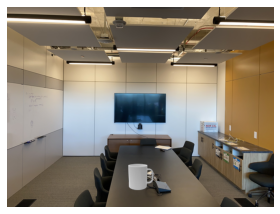

In [ ]:
from kornia.filters import gaussian_blur2d
from kornia.augmentation.container import AugmentationSequential, ImageSequential
import kornia.augmentation as augmentation


#B = [None,3,7,11]
B = [None]
prob=0.5
aug = ImageSequential(
    #augmentation.RandomPerspective(p=prob),
    augmentation.RandomElasticTransform(p=prob),
    augmentation.ColorJitter(0.3,0.3,0.3,0.2, p=prob),
    augmentation.RandomHorizontalFlip(p=prob),
    augmentation.RandomGaussianBlur(p=prob, kernel_size=(13,13), sigma=(2.0,2.0)),
    augmentation.RandomGrayscale(p=prob),
    same_on_batch=False
).to(device)
N_IMAGE_AUGMENTATIONS = 8

def augment_image(renderer):
  return renderer(blur=None).unsqueeze(0)
  return aug(renderer(blur=None).repeat((N_IMAGE_AUGMENTATIONS,1,1,1)))
  return torch.stack([
                      renderer(blur=b)
                      for b in B
  ])

with torch.no_grad():
  augmented_images = augment_image(renderer_class(s=0, bg=bg).to(device))
  plt.figure(figsize=(4*len(augmented_images),4))
  for i,aug_im in enumerate(augmented_images):
    plt.subplot(1,len(augmented_images),i+1)
    plt.imshow(aug_im.permute((1,2,0)).cpu())
    #if b is None:
    #plt.title('blur = %s' % b)
    #else:
      #plt.title('blur = %.2f' % b)
    plt.axis('off')

plt.tight_layout()
plt.savefig('figs/3_2-blur-examples.pdf', bbox_inches='tight')
plt.show()

In [ ]:
from torch.nn.utils import clip_grad_norm_, clip_grad_value_
grad_clip_val = 3.0

S = np.linspace(-2,2,256)
all_losses = []
all_gradients = []

text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features /= text_features.norm(dim=-1).unsqueeze(-1)
for s in tqdm(S, desc='computing all gradients'):
  renderer = renderer_class(s=s, bg=bg).to(device)
  #im = renderer().unsqueeze(0)
  augmented_images = p(augment_image(renderer))
  
  image_features = model.encode_image(augmented_images).squeeze()
  image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
  loss = -torch.mean(text_features@image_features_norm.T)
  loss.backward()
  #clip_grad_value_(renderer.parameters(), clip_value=grad_clip_val)
  all_losses.append(loss.detach().cpu().item())
  all_gradients.append(renderer.s.grad.detach().item())
  del image_features
  del image_features_norm
  del augmented_images
del text_features
torch.cuda.empty_cache();

np.save('%s-gradients-%s' % ("vanilla" if B == [None] else "aug", "coarse" if len(S) == 100 else "fine"), all_gradients)

computing all gradients:   0%|          | 0/256 [00:00<?, ?it/s]

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR, CosineAnnealingWarmRestarts

lr = 0.1

gd_losses = defaultdict(list)
s_values = defaultdict(list)
gradients = defaultdict(list)

for s_init in [-1.01,-1]: # , 0.0, 1.0]:
  lr_steps = []
  #images_for_gif = []
  text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
  text_features /= text_features.norm(dim=-1).unsqueeze(-1)

  #param_values = defaultdict(list)
  #gradients = defaultdict(list)
  renderer = renderer_class(s=s_init, bg=bg).to(device)
  epochs = np.arange(50)
  optimizer = optim.Adam(renderer.parameters(), lr=lr, betas=(0.75,0.95))
  scheduler = CosineAnnealingLR(optimizer, T_max=len(epochs), eta_min=0.01)
  #scheduler = MultiStepLR(optimizer, gamma=0.5, milestones=[5,10,20,40])
  #scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=15, eta_min=0.01)
  t = tqdm(epochs)

  model.eval()
  for epoch in t:
      optimizer.zero_grad()
      #images_for_gif.append(ToPILImage()(im))
      # augmented_images = p(im).unsqueeze(0)
      augmented_images = p(augment_image(renderer))

      # forward pass
      image_features = model.encode_image(augmented_images).squeeze()
      image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
      loss = -torch.mean(text_features@image_features_norm.T)

      # backprop
      loss.backward()
      clip_grad_value_(renderer.parameters(), clip_value=grad_clip_val)

      # log info
      gd_losses[s_init].append(loss.detach().cpu().item())
      s_values[s_init].append(renderer.s.detach().item())
      gradients[s_init].append(renderer.s.grad.detach().item())

      # step
      optimizer.step()
      lr_steps.append(scheduler.get_last_lr())
      scheduler.step()
      del image_features
      del image_features_norm
      # update info
      t.set_description('s_init=%.2f, loss=%.2f, s=%.2f' % (s_init, loss, s_values[s_init][-1]), refresh=True)

del text_features
torch.cuda.empty_cache();

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

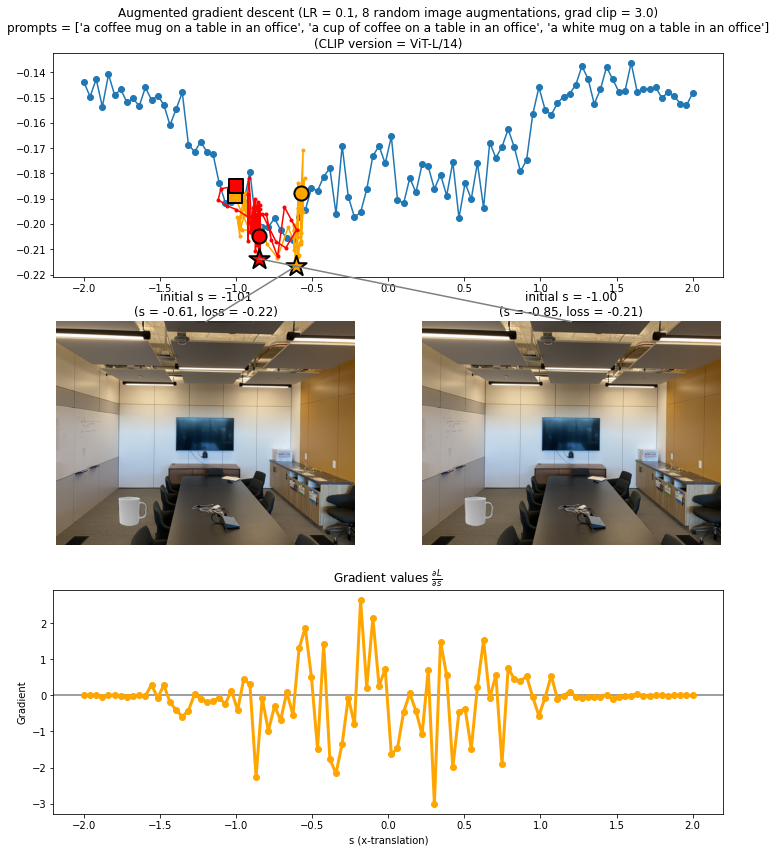

In [ ]:
fig = plt.figure(figsize=(12,14))

# loss landscape
plt.subplot(3,1,1)
plt.plot(S, all_losses, 'o-')
colors = ['orange', 'red', 'green']
for s_init,color in zip(s_values.keys(), colors):
  # best epoch
  best_epoch = np.argmin(gd_losses[s_init])
  plt.scatter(s_values[s_init][best_epoch], gd_losses[s_init][best_epoch], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5, color=color)
  # GD path
  plt.scatter(s_values[s_init][-1], gd_losses[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gd_losses[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gd_losses[s_init], '.-', color=color, label='initial s = %.2f' % s_init)
#plt.legend()
plt.title(
    r'Augmented gradient descent (LR = %.1f, %d random image augmentations, grad clip = %.1f)' % (lr, N_IMAGE_AUGMENTATIONS, grad_clip_val)
    + '\nprompts = %s\n(CLIP version = %s)' % (text_prompts, model_name)
)
ax_loss = plt.gca()


for i,k in enumerate(s_values.keys()):
    plt.subplot(3,len(s_values),1*len(s_values)+i+1)

    i_opt = np.argmin(gd_losses[k])
    im_opt = renderer_class(s_values[k][i_opt], bg=bg).to(device)().cpu().permute((1,2,0)).detach()
    plt.axis('off')
    plt.title('initial s = %.2f\n(s = %.2f, loss = %.2f)' % (k, s_values[k][i_opt], gd_losses[k][i_opt]))
    plt.imshow(im_opt, zorder=5)
    ax_im = plt.gca()
    
    transFigure = fig.transFigure.inverted()
    coord1 = transFigure.transform(ax_loss.transData.transform([s_values[k][i_opt], gd_losses[k][i_opt]]))
    coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[1]/2, 0]))
    line = lines.Line2D(
        (coord1[0], coord2[0]),  # xdata
        (coord1[1], coord2[1]),  # ydata
        transform=fig.transFigure,
        color="grey",
        zorder=1
    )
    fig.lines.append(line)


plt.subplot(3,1,3)
plt.plot(S, np.array(all_gradients), 'o-', lw=3, label=r'Gradient', alpha=1.0, color='orange')
plt.title(r'Gradient values $\frac{\partial L}{\partial s}$')
plt.xlabel('s (%s)' % renderer.description)
plt.ylabel(r'Gradient')
plt.axhline(y=0.0, color='grey', linestyle='-', alpha=1.0, zorder=1)


#plt.tight_layout()
plt.savefig('figs/3_2-room-augment-gd.pdf', bbox_inches='tight')
plt.show()

# Gaussian fixed sampling (bad)

In [ ]:
mug_size_tx = 50
im_mug_tx = load_im_mug(mug_size_tx)
class MugMoidTranslatePerturb(BaseRenderer):
    def __init__(self, s=0, bg=False):
        super().__init__()
        self.s = nn.Parameter(torch.Tensor([s]))
        self.description = 'x-translation'
        self.bg = bg

    def forward(self, perturb=[0]):
      images = []
      for p in perturb:
        room = im_room.clone()
        mug = im_mug_tx.unsqueeze(0)
        translation = torch.cat((
          (im_mug_tx.shape[2]-mug_size_tx)*0.5*(self.s+p).tanh(),
            torch.tensor([im_mug_tx.shape[1]*0.35]).to(device)
        )).unsqueeze(0)
        mug = translate(mug, translation)
        mug = mug.squeeze()
        room[mug > 0.2] = mug[mug > 0.2]
        images.append(room)
      return torch.stack(images)

text_prompts = ["a coffee mug on a table in an office"]
renderer_class = MugMoidTranslatePerturb
bg=True
#MugMoidTranslatePerturb(0.5, bg=bg).to(device)(np.linspace(-0.2,0.2,15)).shape

In [ ]:
from scipy.stats import norm
from scipy.ndimage import gaussian_filter1d

S = np.linspace(-2,2,100)
raw_losses = []
filtered_losses = []
raw_gradients = []
filtered_gradients = []

text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features_norm = text_features / text_features.norm(dim=-1).unsqueeze(-1)

# filter weights
perturbations = np.linspace(-0.1,0.1,7)
probe = np.zeros(len(perturbations))
probe[len(probe)//2] = 1
sigma = 2.0
weights = torch.tensor(gaussian_filter1d(probe, sigma)).to(device)
#weights = torch.ones(len(perturbations)).div(len(perturbations)).to(device)
for s in tqdm(S, desc='computing all gradients'):
  renderer = renderer_class(s=s, bg=bg).to(device)
  augmented_images = renderer(perturbations)
  image_features = model.encode_image(p(augmented_images)).squeeze()
  image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
  scores = torch.squeeze(text_features_norm@image_features_norm.T)
  filtered_loss = -torch.sum( weights*scores )
  filtered_loss.backward()
  filtered_losses.append(filtered_loss.detach().cpu().item())
  filtered_gradients.append(renderer.s.grad.detach().item())

  renderer = renderer_class(s=s, bg=bg).to(device)
  images = renderer()
  image_features = model.encode_image(p(images)).squeeze()
  image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
  scores = torch.squeeze(text_features_norm@image_features_norm.T)
  raw_loss = -torch.squeeze(scores)
  raw_loss.backward()
  raw_losses.append(raw_loss.detach().cpu().item())
  raw_gradients.append(renderer.s.grad.detach().item())

  del image_features
  del image_features_norm
  del augmented_images
torch.cuda.empty_cache();

computing all gradients:   0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matricesor `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2318.)


In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR, CosineAnnealingWarmRestarts

lr = 0.01

gd_losses = defaultdict(list)
s_values = defaultdict(list)
gradients = defaultdict(list)

for s_init in [-1, 1]: # , 0.0, 1.0]:
  lr_steps = []
  #images_for_gif = []

  #param_values = defaultdict(list)
  #gradients = defaultdict(list)
  renderer = renderer_class(s=s_init, bg=bg).to(device)
  epochs = np.arange(10000)
  optimizer = optim.Adam(renderer.parameters(), lr=lr)
  scheduler = CosineAnnealingLR(optimizer, T_max=len(epochs), eta_min=0.001)
  #scheduler = MultiStepLR(optimizer, gamma=0.5, milestones=[5,10,20,40])
  #scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=15, eta_min=0.01)
  t = tqdm(epochs)

  model.eval()
  for epoch in t:
      optimizer.zero_grad()
      #images_for_gif.append(ToPILImage()(im))
      augmented_images = p(renderer(perturbations))

      # forward pass
      image_features = model.encode_image(augmented_images).squeeze()
      image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
      scores = torch.squeeze(text_features_norm@image_features_norm.T)
      loss = -torch.sum(weights*scores)

      # backprop
      loss.backward()

      # log info
      gd_losses[s_init].append(loss.detach().cpu().item())
      s_values[s_init].append(renderer.s.detach().item())
      gradients[s_init].append(renderer.s.grad.detach().item())

      # step
      optimizer.step()
      #print('GRADIENT = %.3f\tΔS = %.3f' % (gradients[s_init][-1], renderer.s.item() - s_values[s_init][-1]))
      lr_steps.append(scheduler.get_last_lr())
      #scheduler.step()
      del image_features
      del image_features_norm
      # update info
      t.set_description('s_init=%.2f, loss=%.2f, s=%.2f' % (s_init, loss, s_values[s_init][-1]), refresh=True)

torch.cuda.empty_cache();

  0%|          | 0/10000 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

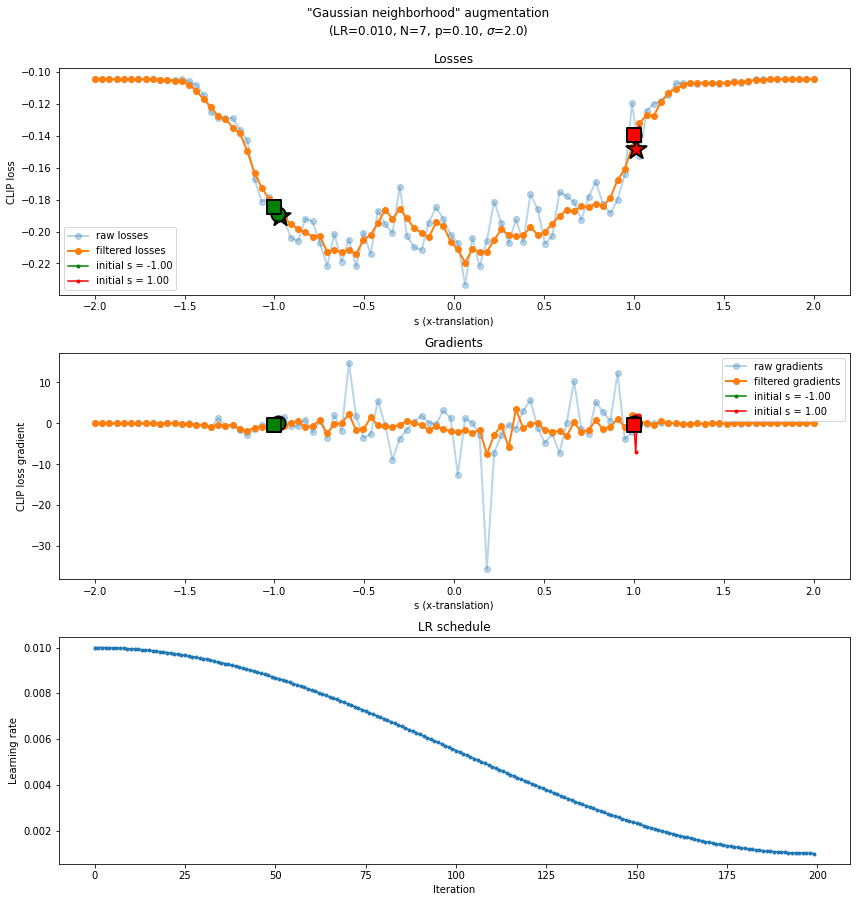

In [ ]:
fig = plt.figure(figsize=(12,12))
plt.subplot(3,1,1)
plt.plot(S, raw_losses, 'o-', lw=2, label='raw losses', alpha=0.3)
plt.plot(S, filtered_losses, 'o-', lw=2, label='filtered losses')
colors = ['green', 'red', 'orange']
for s_init,color in zip(s_values.keys(), colors):
  # best epoch
  best_epoch = np.argmin(gd_losses[s_init])
  plt.scatter(s_values[s_init][best_epoch], gd_losses[s_init][best_epoch], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5, color=color)
  # GD path
  plt.scatter(s_values[s_init][-1], gd_losses[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gd_losses[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gd_losses[s_init], '.-', color=color, label='initial s = %.2f' % s_init)

plt.legend()
plt.xlabel('s (%s)' % renderer_class().description)
plt.ylabel('CLIP loss')
plt.title('Losses')

plt.subplot(3,1,2)
plt.plot(S, raw_gradients, 'o-', lw=2, label='raw gradients', alpha=0.3)
plt.plot(S, filtered_gradients, 'o-', lw=2, label='filtered gradients')
for s_init,color in zip(s_values.keys(), colors):
  # GD path
  plt.scatter(s_values[s_init][-1], gradients[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gradients[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gradients[s_init], '.-', color=color, label='initial s = %.2f' % s_init)

plt.legend()
plt.xlabel('s (%s)' % renderer_class().description)
plt.ylabel('CLIP loss gradient')
plt.title('Gradients')

plt.subplot(3,1,3)
plt.plot(epochs, lr_steps, '.-')
plt.xlabel('Iteration')
plt.ylabel('Learning rate')
plt.title('LR schedule')

plt.suptitle(
    '"Gaussian neighborhood" augmentation\n'
    r'(LR=%.3f, N=%d, p=%.2f, $\sigma$=%.1f)' % (lr, len(perturbations), max(perturbations), sigma), y=1.04)
plt.tight_layout()
plt.show()

# Gaussian sampling

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR, CosineAnnealingWarmRestarts

text_prompts = ["a coffee mug on a table in an office"]
renderer_class = MugMoidTranslatePerturb
bg=True

text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features_norm = text_features / text_features.norm(dim=-1).unsqueeze(-1)

lr = 0.01
N = 15
sigma = 0.075


gd_losses = defaultdict(list)
s_values = defaultdict(list)
gradients = defaultdict(list)

for s_init in [-1, 1]: # , 0.0, 1.0]:
  lr_steps = []
  #images_for_gif = []
  renderer = renderer_class(s=s_init, bg=bg).to(device)
  epochs = np.arange(300)
  optimizer = optim.Adam(renderer.parameters(), lr=lr)
  scheduler = CosineAnnealingLR(optimizer, T_max=len(epochs), eta_min=0.001)
  #scheduler = MultiStepLR(optimizer, gamma=0.5, milestones=[5,20,40])
  #scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=15, eta_min=0.01)
  t = tqdm(epochs)

  model.eval()
  for epoch in t:
      optimizer.zero_grad()
      #images_for_gif.append(ToPILImage()(im))
      perturbations = np.random.normal(size=N)
      augmented_images = p(renderer(sigma*perturbations))

      # forward pass
      image_features = model.encode_image(augmented_images).squeeze()
      image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
      scores = torch.squeeze(text_features_norm@image_features_norm.T)
      loss = -torch.mean(scores)

      # backprop
      loss.backward()

      # log info
      gd_losses[s_init].append(loss.detach().cpu().item())
      s_values[s_init].append(renderer.s.detach().item())
      gradients[s_init].append(renderer.s.grad.detach().item())

      # step
      optimizer.step()
      #print('GRADIENT = %.3f\tΔS = %.3f' % (gradients[s_init][-1], renderer.s.item() - s_values[s_init][-1]))
      lr_steps.append(scheduler.get_last_lr())
      scheduler.step()
      del image_features
      del image_features_norm
      # update info
      t.set_description('s_init=%.2f, loss=%.2f, s=%.2f' % (s_init, loss, s_values[s_init][-1]), refresh=True)

torch.cuda.empty_cache();

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

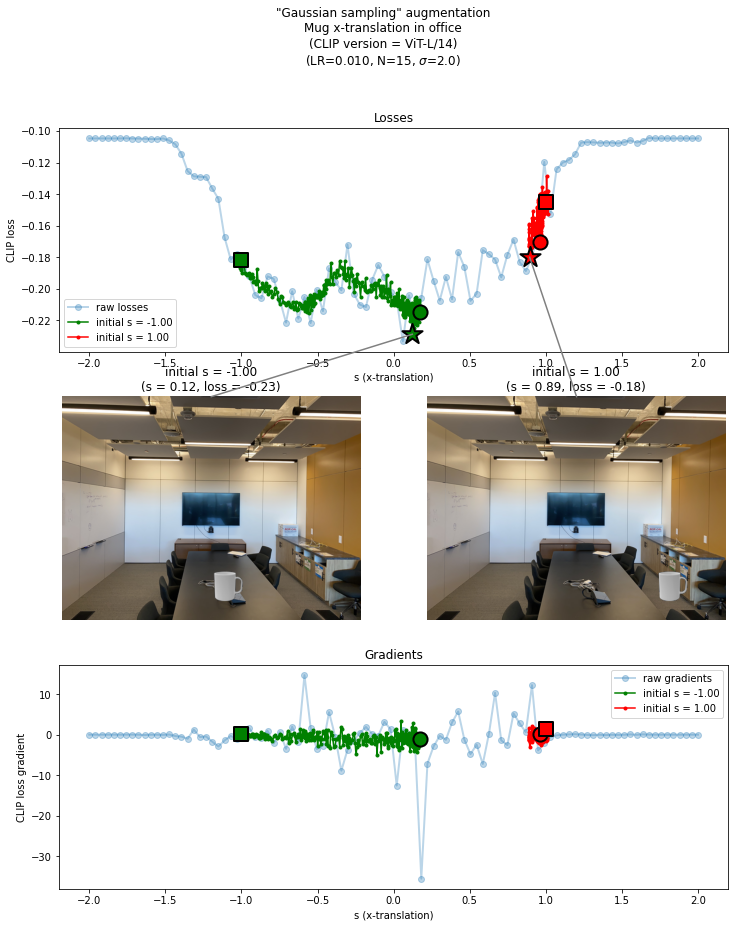

In [ ]:
fig = plt.figure(figsize=(12,14))
plt.subplot(3,1,1)
plt.plot(S, raw_losses, 'o-', lw=2, label='raw losses', alpha=0.3)
colors = ['green', 'red', 'orange']
for s_init,color in zip(s_values.keys(), colors):
  # best epoch
  best_epoch = np.argmin(gd_losses[s_init])
  plt.scatter(s_values[s_init][best_epoch], gd_losses[s_init][best_epoch], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5, color=color)
  # GD path
  plt.scatter(s_values[s_init][-1], gd_losses[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gd_losses[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gd_losses[s_init], '.-', color=color, label='initial s = %.2f' % s_init)

plt.legend()
plt.xlabel('s (%s)' % renderer_class().description)
plt.ylabel('CLIP loss')
plt.title('Losses')
ax_loss = plt.gca()

for i,k in enumerate(s_values.keys()):
    plt.subplot(3,len(s_values),1*len(s_values)+i+1)
    i_opt = np.argmin(gd_losses[k])
    im_opt = renderer_class(s_values[k][i_opt], bg=bg).to(device)()[0].cpu().permute((1,2,0)).detach()
    plt.axis('off')
    plt.title('initial s = %.2f\n(s = %.2f, loss = %.2f)' % (k, s_values[k][i_opt], gd_losses[k][i_opt]))
    plt.imshow(im_opt, zorder=5)
    ax_im = plt.gca()
    
    transFigure = fig.transFigure.inverted()
    coord1 = transFigure.transform(ax_loss.transData.transform([s_values[k][i_opt], gd_losses[k][i_opt]]))
    coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[1]/2, 0]))
    line = lines.Line2D(
        (coord1[0], coord2[0]),  # xdata
        (coord1[1], coord2[1]),  # ydata
        transform=fig.transFigure,
        color="grey",
        zorder=1
    )
    fig.lines.append(line)


plt.subplot(3,1,3)
plt.plot(S, raw_gradients, 'o-', lw=2, label='raw gradients', alpha=0.3)
for s_init,color in zip(s_values.keys(), colors):
  # GD path
  plt.scatter(s_values[s_init][-1], gradients[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gradients[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gradients[s_init], '.-', color=color, label='initial s = %.2f' % s_init)

plt.legend()
plt.xlabel('s (%s)' % renderer_class().description)
plt.ylabel('CLIP loss gradient')
plt.title('Gradients')

#plt.subplot(3,1,3)
#for s_init,color in zip(s_values.keys(), colors):
#  plt.plot(epochs, gd_losses[s_init], label='initial s=%.2f' % s_init, lw=2)
#plt.title('"Gaussian sampling" augmentation\nLoss over time')
#plt.xlabel('Iteration')
#plt.ylabel('CLIP loss')
#plt.legend()

plt.suptitle(
    '"Gaussian sampling" augmentation\n'
    'Mug x-translation in office\n'
    '(CLIP version = %s)\n'
    r'(LR=%.3f, N=%d, $\sigma$=%.1f)' % (model_name, lr, N, sigma), y=1.0)
#plt.tight_layout()
plt.savefig('figs/4_gaussian-sampling-gd.pdf', bbox_inches='tight')
plt.show()

# Gradient analysis

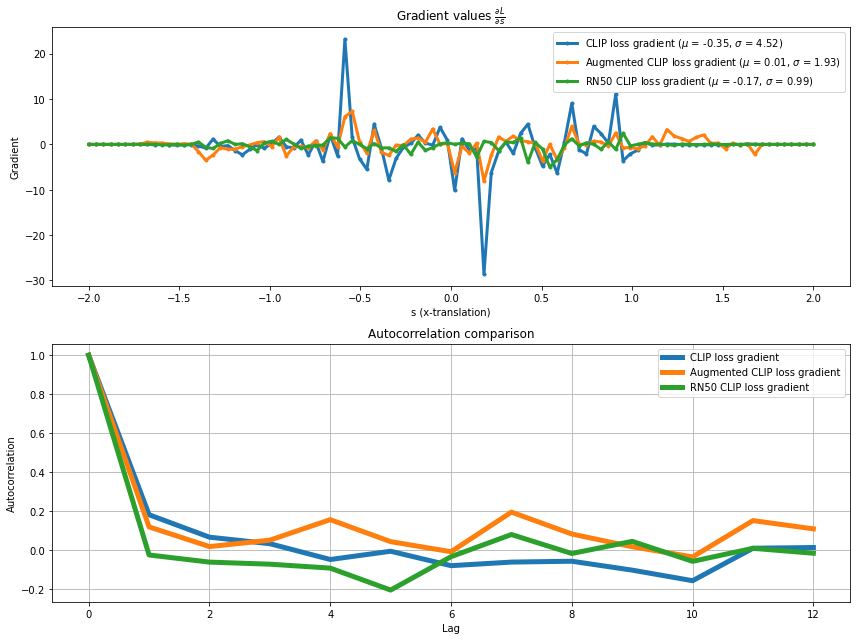

In [ ]:
vanilla_gradients_coarse = np.load('vanilla-gradients-coarse.npy')
aug_gradients_coarse = np.load('aug-gradients-coarse.npy')
rn50_gradients_coarse = np.load('rn50-gradients-coarse.npy')

plt.figure(figsize=(12,9))

plt.subplot(2,1,1)
for gradients_coarse,label in [
                    (vanilla_gradients_coarse,"CLIP loss gradient"),
                    (aug_gradients_coarse,"Augmented CLIP loss gradient"),
                    (rn50_gradients_coarse,"RN50 CLIP loss gradient"),
                    ]:
  mu,std = np.mean(gradients_coarse), np.std(gradients_coarse)
  plt.plot(np.linspace(-2,2,len(gradients_coarse)), gradients_coarse, '.-', lw=3, label=label + r' ($\mu$ = %.2f, $\sigma$ = %.2f)' % (mu, std))
plt.legend()
plt.ylabel('Gradient')
plt.xlabel('s (%s)' % renderer_class().description)
plt.title(r'Gradient values $\frac{\partial L}{\partial s}$')

plt.subplot(2,1,2)
vanilla_gradients_fine = np.load('vanilla-gradients-fine.npy')
aug_gradients_fine = np.load('aug-gradients-fine.npy')
rn50_gradients_fine = np.load('rn50-gradients-fine.npy')
def autocorr(x,lags):
    corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in lags]
    return np.array(corr)

lags = np.arange(13)
plt.plot(lags, autocorr(vanilla_gradients_fine, lags), label='CLIP loss gradient', lw=5)
plt.plot(lags, autocorr(aug_gradients_fine, lags), label='Augmented CLIP loss gradient', lw=5)
plt.plot(lags, autocorr(rn50_gradients_fine, lags), label='RN50 CLIP loss gradient', lw=5)
#np.random.seed(1337)
#plt.plot(lags, autocorr(np.random.normal(0,1,size=len(vanilla_gradients_fine)), lags), label=r'White noise $\sim \mathcal{N}(0,1)$', lw=3)
plt.legend()
plt.title('Autocorrelation comparison')
plt.xlabel('Lag')
plt.grid('on')
plt.ylabel('Autocorrelation')


plt.tight_layout()
plt.savefig('figs/3_2-gradients-acf.pdf', bbox_inches='tight')
plt.show()

# Gradient-free optimization

     fun: -0.21409210562705994
 message: ['Maximum number of iteration reached']
    nfev: 27
    nhev: 0
     nit: 10
    njev: 3
  status: 0
 success: True
       x: array([-0.5698])


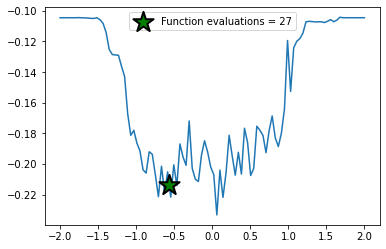

In [ ]:
from scipy.optimize import dual_annealing

with torch.no_grad():
  text_enc = model.encode_text(clip.tokenize(text_prompts).to(device))
  text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)

  def func(s):
    im_enc = model.encode_image(
        p(renderer_class(*s, bg=bg).to(device)()).unsqueeze(0)
    )
    im_enc_norm = im_enc / im_enc.norm(dim=-1).unsqueeze(-1)
    return -(im_enc_norm@text_enc_norm.T).squeeze().item()

  func.calls = 0
  result = dual_annealing(
    func,
    bounds=[(-3,3)],
    local_search_options={'options': {'maxiter': 5}},
    maxiter=10,
    seed=1337
  )
  print(result)

plt.plot(S, all_losses)
plt.scatter(result.x[0], result.fun, marker='*', edgecolor='black', linewidth=2, s=450, zorder=5, color=color, label='Function evaluations = %d' % result.nfev)
plt.legend()
plt.show()

# Multi-parameter

In [ ]:
mug_size_scale = 75
im_mug_scale = load_im_mug(mug_size_scale)
class MugMoidMulti(BaseRenderer):
  def __init__(self, s=[0,0,0,0], bg=False):
    super().__init__()
    self.s = nn.Parameter(torch.Tensor(s))
    self.param_names = ['scale', 'rotation', 'x-translation', 'y-translation']
    self.bg = bg
    self.im_size = torch.tensor([im_mug_tx.shape[2], im_mug_tx.shape[1]], device=device) - mug_size_tx

  def forward(self, blur=None):
    room = im_room.clone()
    if blur is not None:
      room = gaussian_blur2d(room.unsqueeze(0), (9,9), sigma=(blur,blur)).squeeze()

    mug = scale(
      im_mug_scale.unsqueeze(0),
      2*self.s[0].sigmoid().unsqueeze(0) #torch.tensor([1.0]).to(device)
    )
    mug = rotate(mug, -self.s[1].tanh()*180)
    mug = translate(mug, self.im_size*0.5*self.s[2:4].tanh().unsqueeze(0))

    mug = mug.squeeze()
    if not self.bg:
      return mug
    room[mug > 0.15] = mug[mug > 0.15]
    return room

In [ ]:
text_prompts = ["a coffee mug on a table in an office"]
renderer_class = MugMoidMulti
bg=True

In [ ]:
from torch.optim.lr_scheduler import ExponentialLR

lr = 0.001

gd_losses = []
s_values = []
gradients = []

s_init = [0,0,0,0]

#images_for_gif = []
text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features /= text_features.norm(dim=-1).unsqueeze(-1)

renderer = renderer_class(s=s_init, bg=bg).to(device)
epochs = np.arange(300)
optimizer = optim.Adam(renderer.parameters(), lr=lr)
#scheduler = MultiStepLR(optimizer, milestones=[25], gamma=0.5)
#scheduler = ExponentialLR(optimizer, gamma=0.9)
scheduler = CosineAnnealingLR(optimizer, T_max=len(epochs), eta_min=0.01)
t = tqdm(epochs)

model.eval()
for epoch in t:
    optimizer.zero_grad()
    im = renderer()
    #images_for_gif.append(ToPILImage()(im))
    augmented_images = p(augment_image(renderer))
    #augmented_images = p(im.unsqueeze(0))

    # forward pass
    image_features = model.encode_image(augmented_images).squeeze()
    image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
    loss = -torch.mean(text_features@image_features_norm.T)

    # backprop
    loss.backward()
    #clip_grad_norm_(renderer.parameters(), max_norm=5, norm_type=2)
    #clip_grad_value_(renderer.parameters(), clip_value=15)

    # log info
    gd_losses.append(loss.detach().cpu().item())
    s_values.append(renderer.s.detach().cpu().numpy())
    gradients.append(renderer.s.grad.detach().cpu().numpy())

    # step
    optimizer.step()
    scheduler.step()

    del image_features
    del image_features_norm

    # update info
    t.set_description('s_init=%s, loss=%.3f, s=%s' % (s_init, gd_losses[-1], s_values[-1]), refresh=True)

s_values = np.array(s_values)
del text_features
torch.cuda.empty_cache();

  0%|          | 0/300 [00:00<?, ?it/s]

tensor(-0.2834, device='cuda:0', grad_fn=<NegBackward0>)


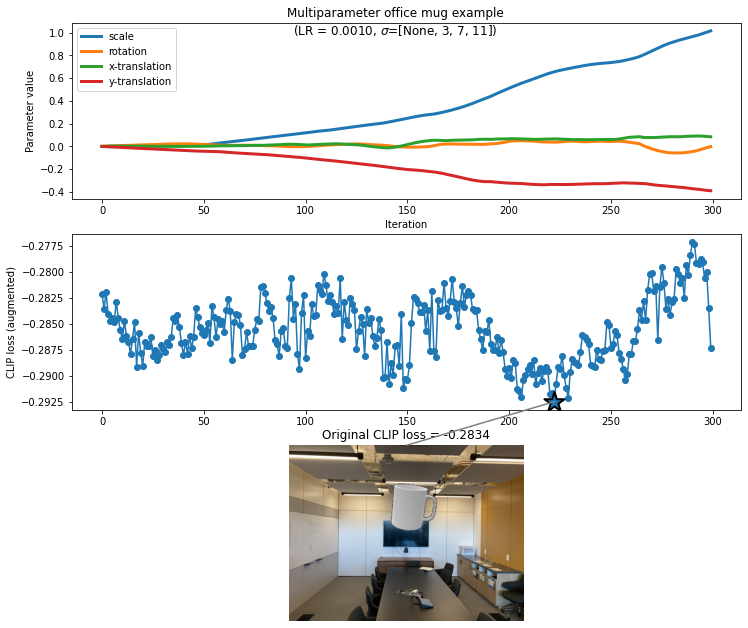

In [ ]:
fig = plt.figure(figsize=(12,11))

plt.subplot(3,1,1)
for s_v,label in zip(s_values.T, renderer.param_names):
  plt.plot(epochs, s_v, label=label, lw=3)
plt.xlabel('Iteration')
plt.ylabel('Parameter value')
plt.legend()

plt.subplot(3,1,2)
i_opt = np.argmin(gd_losses)
plt.plot(epochs, gd_losses, 'o-')
plt.scatter(epochs[i_opt], gd_losses[i_opt], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5)
#plt.xlabel('Iteration')
plt.ylabel('CLIP loss (augmented)')
ax_loss = plt.gca()

plt.subplot(3,1,3)
ax_im = plt.gca()
im_opt = renderer_class(s=s_values[i_opt], bg=bg).to(device)()
plt.imshow(im_opt.permute((1,2,0)).detach().cpu())

text_enc = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_enc_norm = text_enc / text_enc.norm(dim=-1).unsqueeze(-1)
original_loss = loss_fn(im_opt.unsqueeze(0), text_enc_norm)
plt.title('Original CLIP loss = %.4f' % original_loss)
plt.axis('off')

transFigure = fig.transFigure.inverted()
coord1 = transFigure.transform(ax_loss.transData.transform([epochs[i_opt], gd_losses[i_opt]]))
coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[2]/2, 0]))
line = lines.Line2D(
    (coord1[0], coord2[0]),  # xdata
    (coord1[1], coord2[1]),  # ydata
    transform=fig.transFigure,
    color="grey",
    zorder=1
)
fig.lines.append(line)

plt.suptitle(
    'Multiparameter office mug example\n'
    r'(LR = %.4f, $\sigma$=%s)' % (lr, B)
    , y=0.9)
#plt.tight_layout()
plt.savefig('figs/3_2-multiparam-loss-graph.pdf', bbox_inches='tight')
plt.show()

# Brute force

In [ ]:
text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features /= text_features.norm(dim=-1).unsqueeze(-1)

R = [20,20,20,20]
all_losses = np.zeros(R)

S0 = np.linspace(-2,2,R[0])
S1 = np.linspace(-2,2,R[1]) + [0]
S1.sort()
S2 = np.linspace(-2,2,R[2])
S3 = np.linspace(-2,2,R[3])

with torch.no_grad():
  for i0,s0 in tqdm(enumerate(S0), total=len(S0)):
    for i1,s1 in enumerate(S1):
      b_images = torch.stack([
        renderer_class(s=[s0,s1,s2,s3]).to(device)()
        for s2 in S2
        for s3 in S3
      ])
      image_features = model.encode_image(p(b_images))
      image_features /= image_features.norm(dim=-1).unsqueeze(-1)
      b_losses = -(text_features@image_features.T).squeeze().cpu().reshape((R[2],R[3]))
      all_losses[i0,i1,:,:] = b_losses
      del image_features
      del b_images
      torch.cuda.empty_cache();


del text_features
torch.cuda.empty_cache();

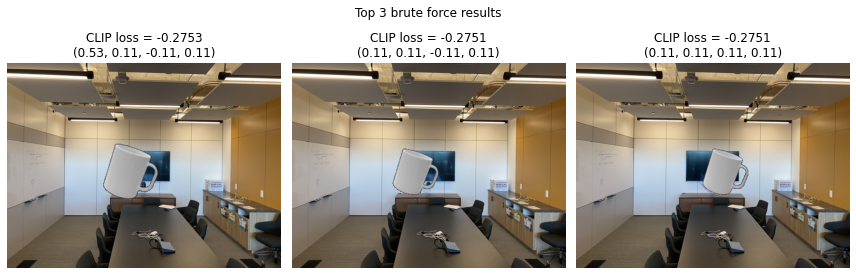

In [ ]:
all_losses = np.load('brute-force.npy')
search_space = all_losses
flat_i = np.argsort(search_space.flatten())[:3]
vals = search_space.flatten()[flat_i]
opt_indices = np.array(np.unravel_index(flat_i, search_space.shape)).T

plt.figure(figsize=(12,4))
cols = 3
for i,(loss,idx) in enumerate(zip(vals, opt_indices)):
  s_opt = [S0[idx[0]], S1[idx[1]], S2[idx[2]], S3[idx[3]]]
  with torch.no_grad():
    im = renderer_class(s=s_opt, bg=bg).to(device)()
    plt.subplot(np.ceil(len(opt_indices)/cols),cols,i+1)
    plt.title('CLIP loss = %.4f\n(%.2f, %.2f, %.2f, %.2f)' % (loss, *s_opt))
    plt.imshow(im.permute((1,2,0)).cpu())
    plt.axis('off')
plt.tight_layout()
plt.suptitle('Top 3 brute force results', y=1.05)
plt.savefig('figs/3_2-brute-force.pdf', bbox_inches='tight')
plt.show()

# New renderer

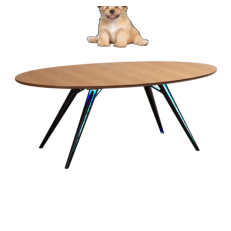

In [ ]:
im_dog = ToTensor()(Image.open('images/table.png')).to(device)
if im_dog.shape[0] == 4:
  im_dog = im_dog[:3,:,:] * (im_dog[-1,:,:].unsqueeze(0) > 0)
#im_dog[im_dog < 0.05] = 1.0
im_bg = torch.ones_like(im_dog)
im_bg[im_dog > 0.01] = im_dog[im_dog > 0.01]

obj_size = 750
im_obj = Image.open('images/puppy.png').convert('RGBA')
im_obj.thumbnail((obj_size,obj_size), Image.ANTIALIAS)
im_obj = ToTensor()(im_obj).to(device)
if im_obj.shape[0] == 4:
  im_obj = im_obj[:3,:,:] * im_obj[-1].unsqueeze(0)

dim_diff = np.array(im_bg.shape[1:]) - np.array(im_obj.shape[1:])
im_obj = F.pad(im_obj, (int(np.floor(dim_diff[1]/2)), int(np.ceil(dim_diff[1]/2)), int(np.floor(dim_diff[0]/2)),int(np.ceil(dim_diff[0]/2))))

class DogRenderer(BaseRenderer):
    def __init__(self, s=0):
        super().__init__()
        self.s = nn.Parameter(torch.Tensor([s]))
        self.description = 'x-translation'

    def forward(self, blur=None):
        bg = im_bg.clone()

        obj = im_obj.unsqueeze(0)
        
        translation = torch.cat((
             torch.tensor([im_obj.shape[1]*0.0]).to(device),
            (im_obj.shape[2]-obj_size)*0.75*self.s.tanh(),
        )).unsqueeze(0)
        obj = translate(obj, translation)
        #obj = scale(obj, 2*self.s.sigmoid())


        obj = obj.squeeze()

        bg[obj > 0.01] = obj[obj > 0.01]
        return bg
    
renderer_class = DogRenderer
plt.imshow(renderer_class(-2).to(device)().cpu().permute((1,2,0)).detach())
plt.axis('off')
plt.show()

computing all gradients:   0%|          | 0/100 [00:00<?, ?it/s]

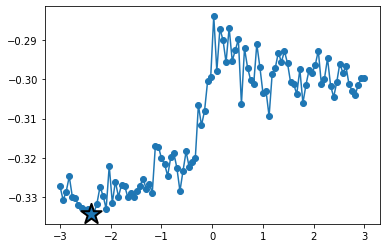

In [ ]:
text_prompts = ["a puppy sitting on a table"]
text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features_norm = text_features/text_features.norm(dim=-1).unsqueeze(-1)

S = np.linspace(-3,3,100)
all_losses = []
#all_gradients = []

with torch.no_grad():
  for s in tqdm(S, desc='computing all gradients'):
    renderer = renderer_class(s=s).to(device)
    augmented_images = p(renderer().unsqueeze(0))

    image_features = model.encode_image(augmented_images).squeeze()
    image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
    loss = -torch.mean(text_features_norm@image_features_norm.T)
    #loss.backward()
    all_losses.append(loss.detach().cpu().item())
    #all_gradients.append(renderer.s.grad.detach().item())
    del image_features
    del image_features_norm
    del augmented_images

  torch.cuda.empty_cache();


plt.plot(S, all_losses, 'o-')
i_opt = np.argmin(all_losses)
plt.scatter(S[i_opt], all_losses[i_opt], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5)
plt.show()

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

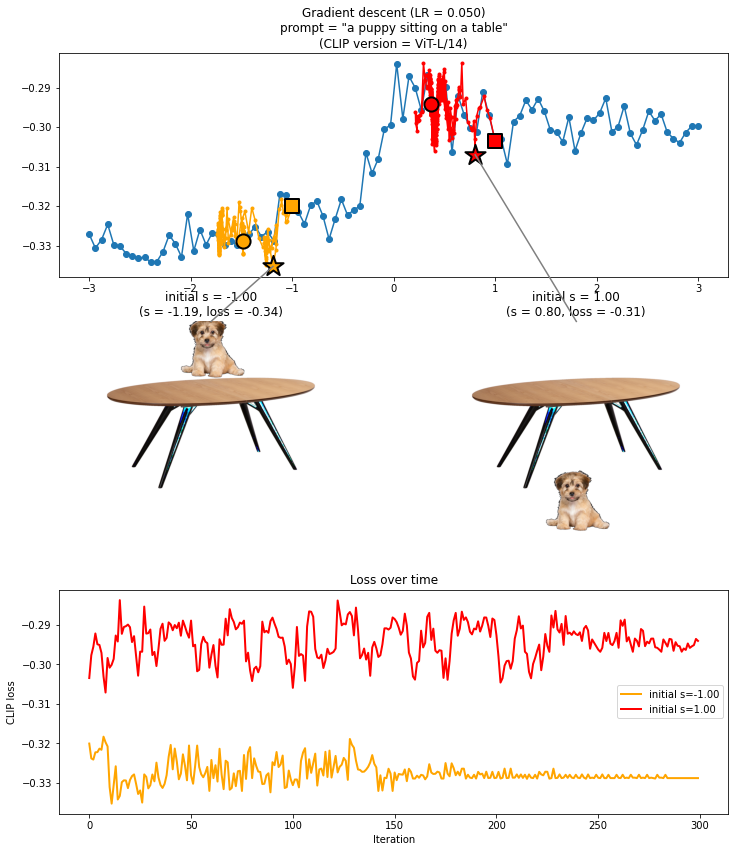

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR, CosineAnnealingWarmRestarts
from collections import defaultdict

lr = 0.05

gd_losses = defaultdict(list)
s_values = defaultdict(list)
gradients = defaultdict(list)

for s_init in [-1, 1.0]: # , 0.0, 1.0]:
  lr_steps = []
  #images_for_gif = []
  text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
  text_features /= text_features.norm(dim=-1).unsqueeze(-1)

  #param_values = defaultdict(list)
  #gradients = defaultdict(list)
  renderer = renderer_class(s=s_init).to(device)
  epochs = np.arange(300)
  optimizer = optim.Adam(renderer.parameters(), lr=lr, betas=(0.75,0.95))
  scheduler = CosineAnnealingLR(optimizer, T_max=len(epochs), eta_min=0.001)
  #scheduler = MultiStepLR(optimizer, gamma=0.5, milestones=[5,10,20,40])
  #scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=15, eta_min=0.01)
  t = tqdm(epochs)

  model.eval()
  for epoch in t:
      optimizer.zero_grad()
      #images_for_gif.append(ToPILImage()(im))
      augmented_images = p(renderer().unsqueeze(0))

      # forward pass
      image_features = model.encode_image(augmented_images).squeeze()
      image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
      loss = -torch.mean(text_features@image_features_norm.T)

      # backprop
      loss.backward()

      # log info
      gd_losses[s_init].append(loss.detach().cpu().item())
      s_values[s_init].append(renderer.s.detach().item())
      gradients[s_init].append(renderer.s.grad.detach().item())

      # step
      optimizer.step()
      lr_steps.append(scheduler.get_last_lr())
      scheduler.step()
      del image_features
      del image_features_norm
      # update info
      t.set_description('s_init=%.2f, loss=%.2f, s=%.2f' % (s_init, loss, s_values[s_init][-1]), refresh=True)

del text_features
torch.cuda.empty_cache();

fig = plt.figure(figsize=(12,14))

# loss landscape
plt.subplot(3,1,1)
plt.plot(S, all_losses, 'o-')
colors = ['orange', 'red', 'green']
for s_init,color in zip(s_values.keys(), colors):
  # best epoch
  best_epoch = np.argmin(gd_losses[s_init])
  plt.scatter(s_values[s_init][best_epoch], gd_losses[s_init][best_epoch], marker='*', edgecolor='black', linewidth=2, s=450, zorder=5, color=color)
  # GD path
  plt.scatter(s_values[s_init][-1], gd_losses[s_init][-1], marker='o', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.scatter(s_values[s_init][0], gd_losses[s_init][0], marker='s', edgecolor='black', linewidth=2, s=200, zorder=5, color=color)
  plt.plot(s_values[s_init], gd_losses[s_init], '.-', color=color, label='initial s = %.2f' % s_init)
#plt.legend()
plt.title(
    r'Gradient descent (LR = %.3f)' % (lr)
    + '\nprompt = "%s"\n(CLIP version = %s)' % (text_prompts[0], model_name)
)
ax_loss = plt.gca()


for i,k in enumerate(s_values.keys()):
    plt.subplot(3,len(s_values),1*len(s_values)+i+1)

    i_opt = np.argmin(gd_losses[k])
    im_opt = renderer_class(s_values[k][i_opt]).to(device)().cpu().permute((1,2,0)).detach()
    plt.axis('off')
    plt.title('initial s = %.2f\n(s = %.2f, loss = %.2f)' % (k, s_values[k][i_opt], gd_losses[k][i_opt]))
    plt.imshow(im_opt, zorder=5)
    ax_im = plt.gca()
    
    transFigure = fig.transFigure.inverted()
    coord1 = transFigure.transform(ax_loss.transData.transform([s_values[k][i_opt], gd_losses[k][i_opt]]))
    coord2 = transFigure.transform(ax_im.transData.transform([im_opt.shape[1]/2, 0]))
    line = lines.Line2D(
        (coord1[0], coord2[0]),  # xdata
        (coord1[1], coord2[1]),  # ydata
        transform=fig.transFigure,
        color="grey",
        zorder=1
    )
    fig.lines.append(line)

plt.subplot(3,1,3)
for k,color in zip(s_values.keys(), colors):
  plt.plot(epochs, gd_losses[k], lw=2, label='initial s=%.2f' % k, color=color)
  plt.xlabel('Iteration')
  plt.ylabel('CLIP loss')
  plt.title('Loss over time')
  plt.legend()

#plt.tight_layout()
plt.savefig('figs/3_2-dog-vanilla-gd.pdf', bbox_inches='tight')
plt.show()

# Gradient experiments

In [ ]:
text_features = model.encode_text(clip.tokenize(text_prompts).to(device)).detach()
text_features /= text_features.norm(dim=-1).unsqueeze(-1)

all_gradients = []
for s in tqdm(S):
    renderer = rc(s, bg=True).to(device)
    im = renderer()
    augmented_images = p(im).unsqueeze(0)
    # forward pass
    image_features = model.encode_image(augmented_images).squeeze()
    image_features_norm = image_features / image_features.norm(dim=-1).unsqueeze(-1)
    loss = -torch.mean(text_features@image_features_norm.T)
    loss.backward()
    all_gradients.append(renderer.s.grad.detach().item())
    del image_features, image_features_norm

del text_features

  0%|          | 0/100 [00:00<?, ?it/s]

# Gif fun

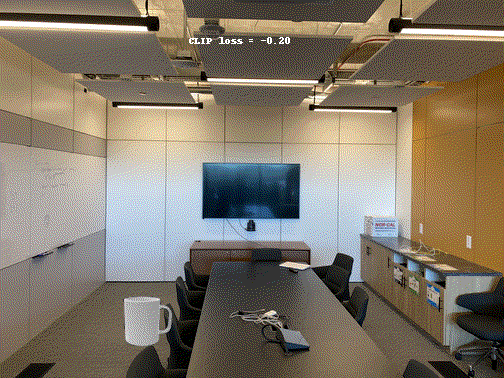

In [ ]:
from PIL import ImageDraw
from PIL import ImageFont
from IPython.display import Image as IPImage

for score,im_to_modify in zip(gd_losses, images_for_gif):
  draw = ImageDraw.Draw(im_to_modify)
  draw.text((im_room.shape[1] // 2, 35), "CLIP loss = %.2f" % score, (255,255,255),)

images_for_gif += [images_for_gif[-1]] * 15

frame_one = images_for_gif[0]
frame_one.save("room-multiparam.gif", format="GIF", append_images=images_for_gif,
            save_all=True, duration=30, loop=0)

IPImage(open('room-singleparam.gif','rb').read())